<a href="https://colab.research.google.com/github/Soham-Chaudhuri/Induction-Motor-Rotor-Bar-Breakage/blob/main/Induction_motor_rotor_bar_breakage_project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Machine Learning for Predicting Rotor Bar Breakage in Induction Motors**

The dataset contains electrical and mechanical signals from simulations on two three-phase squirrel cage induction motors with different rotor and stator slot combinations modeled using MATLAB software.

An Induction Motor with specifications of **2.2 kW, 2 poles, 3-phase, 50 Hz, and 400 V was tested under full mechanical load** on the motor axis. The simulation included different rotor bar breakage scenarios—one broken bar, two broken bars, and three broken bars—alongside data from a defect-free (healthy) rotor. The tests were conducted at a **2 kHz sampling rate**, capturing comprehensive data on rotor performance under varying conditions.

In [ ]:
#Importing important modules and packages from python
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler,LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier, GradientBoostingClassifier, StackingClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Dataset


The dataset obtained from a open source library.

In [ ]:
#Loading Dataset
df_healthy = pd.read_excel('M24Ns_29Nb.xlsx',sheet_name='H')
df_1broken = pd.read_excel('M24Ns_29Nb.xlsx',sheet_name='1B')
df_2broken = pd.read_excel('M24Ns_29Nb.xlsx',sheet_name='2B')
df_3broken = pd.read_excel('M24Ns_29Nb.xlsx',sheet_name='3B')

#Setting Feature Names
features_names = ['Time', 'Phase-A Stator_Current', 'Phase-B_Stator_Current', 'Phase-C_Stator_Current', 'Rotor_Bar_1_Current','Rotor_Bar_2_Current','Rotor_Bar_3_Current','Rotor_Bar_4_Current','Rotor_Bar_5_Current','Rotor_Bar_6_Current','Rotor_Bar_7_Current','Rotor_Bar_8_Current','Rotor_Bar_9_Current','Rotor_Bar_10_Current','Rotor_Bar_11_Current','Rotor_Bar_12_Current','Rotor_Bar_13_Current','Rotor_Bar_14_Current','Rotor_Bar_15_Current','Rotor_Bar_16_Current','Rotor_Bar_17_Current','Rotor_Bar_18_Current','Rotor_Bar_19_Current','Rotor_Bar_20_Current','Rotor_Bar_21_Current','Rotor_Bar_22_Current','Rotor_Bar_23_Current','Rotor_Bar_24_Current','Rotor_Bar_25_Current','Rotor_Bar_26_Current','Rotor_Bar_27_Current','Rotor_Bar_28_Current','Rotor_Bar_29_Current', 'Ring_current',	'Rotor_Speed',	'Rotor_Position', 'Target_Classes']
df_healthy.columns = features_names
df_1broken.columns = features_names
df_2broken.columns = features_names
df_3broken.columns = features_names

# Data Visualization

Visualizing the data for better understanding the dataset.

In [ ]:
df_healthy.head(10)

,Time,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Bar_1_Current,Rotor_Bar_2_Current,Rotor_Bar_3_Current,Rotor_Bar_4_Current,Rotor_Bar_5_Current,Rotor_Bar_6_Current,Rotor_Bar_7_Current,Rotor_Bar_8_Current,Rotor_Bar_9_Current,Rotor_Bar_10_Current,Rotor_Bar_11_Current,Rotor_Bar_12_Current,Rotor_Bar_13_Current,Rotor_Bar_14_Current,Rotor_Bar_15_Current,Rotor_Bar_16_Current,Rotor_Bar_17_Current,Rotor_Bar_18_Current,Rotor_Bar_19_Current,Rotor_Bar_20_Current,Rotor_Bar_21_Current,Rotor_Bar_22_Current,Rotor_Bar_23_Current,Rotor_Bar_24_Current,Rotor_Bar_25_Current,Rotor_Bar_26_Current,Rotor_Bar_27_Current,Rotor_Bar_28_Current,Rotor_Bar_29_Current,Ring_current,Rotor_Speed,Rotor_Position,Target_Classes
0,0.0010,11.251738,-7.225974,-4.025764,-946.845439,-597.824606,-220.850158,166.450997,545.969089,899.958274,1211.866409,1467.109018,1653.751240,1763.065892,1789.941543,1733.121516,1595.262653,1382.811082,1105.700802,776.889180,411.751085,27.359966,-358.310475,-727.226716,-1062.138644,-1347.386149,-1569.631376,-1718.482384,-1786.979065,-1771.918592,-1674.005175,-1497.817136,-1251.592833,-3.287566e-10,-2.606268,-0.001303,Healthy
1,0.0015,15.667036,-11.275256,-4.391779,-1523.098280,-1051.796601,-531.314082,14.012094,558.683079,1077.230665,1545.408142,1941.324051,2246.465806,2446.565317,2532.266152,2499.561037,2349.979225,2090.514997,1733.300611,1295.039015,796.222834,260.176158,-288.036066,-822.780044,-1319.051741,-1753.646045,-2106.241809,-2360.352046,-2504.094846,-2530.748953,-2439.068053,-2233.339040,-1923.181577,-8.884105e-09,-3.904210,-0.002932,Healthy
2,0.0020,19.201193,-15.426750,-3.774443,-2138.190789,-1580.398652,-948.708831,-272.658439,416.141159,1085.482459,1704.067805,2242.972834,2676.998947,2985.851564,3155.089081,3176.798139,3049.963646,2780.516244,2381.054992,1870.258255,1272.010320,614.284597,-72.164391,-755.239053,-1402.999575,-1985.157397,-2474.491466,-2848.121063,-3088.575686,-3184.611942,-3131.739282,-2932.429975,-2596.003501,3.049064e-09,-5.188613,-0.005206,Healthy
3,0.0025,21.818096,-19.540866,-2.277230,-2768.960922,-2160.483245,-1450.983774,-673.637914,135.206507,937.728821,1696.403978,2375.757170,2944.022598,3374.628800,3647.441111,3749.703130,3676.633197,3431.647983,3026.202722,2479.255586,1816.381215,1068.574876,270.803164,-539.631003,-1324.832625,-2048.086545,-2675.574214,-3177.955007,-3531.738156,-3720.381154,-3735.063264,-3575.097967,-3247.965062,-1.845719e-07,-6.443648,-0.008115,Healthy
4,0.0030,23.498826,-23.482554,-0.016272,-3392.057704,-2768.075995,-2014.662128,-1167.044900,-264.857949,649.713465,1533.905000,2346.372842,3049.126898,3609.307169,4000.720248,4205.064095,4212.783818,4023.518453,3646.117836,3098.228802,2405.470032,1600.234158,720.173112,-193.562427,-1098.247203,-1951.579160,-2713.657444,-3348.848122,-3827.450384,-4127.085320,-4233.742333,-4142.434260,-3857.430565,-1.129105e-06,-7.646217,-0.011642,Healthy
5,0.0035,24.241129,-27.123980,2.882851,-3984.483958,-3378.926298,-2615.373800,-1729.529329,-762.813989,239.569685,1230.751347,2164.384443,2996.813329,3689.114554,4208.916883,4531.914937,4643.005684,4536.994647,4218.838782,3703.414705,3014.823072,2185.261663,1253.519847,263.164837,-739.495469,-1707.577788,-2595.815668,-3362.676092,-3972.301520,-4396.186543,-4614.510770,-4617.065601,-4403.731577,-4.191925e-07,-8.764413,-0.015750,Healthy
6,0.0040,24.062532,-30.348713,6.286181,-4524.437533,-3969.228932,-3228.423598,-2336.660765,-1335.638271,-272.162817,804.038669,1842.644199,2795.089735,3616.839982,4269.470810,4722.465929,4954.643789,4955.148013,4723.955022,4271.875145,3620.047134,2798.949742,1846.976571,808.640829,-267.506060,-1331.144664,-2332.540422,-3224.869182,-3966.406644,-4522.479340,-4867.085928,-4984.112987,-4868.088463,1.248056e-06,-9.762784,-0.020385,Healthy
7,0.0045,23.000522,-33.052487,10.051965,-4991.492402,-4515.798461,-3828.950803,-2963.065661,-1958.630861,-862.612660,273.740351,1397.293567,2455.510889,3398.911251,4183.382300,4772.243043,5137.959004,5263.429

In [ ]:
df_1broken.head(10)

,Time,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Bar_1_Current,Rotor_Bar_2_Current,Rotor_Bar_3_Current,Rotor_Bar_4_Current,Rotor_Bar_5_Current,Rotor_Bar_6_Current,Rotor_Bar_7_Current,Rotor_Bar_8_Current,Rotor_Bar_9_Current,Rotor_Bar_10_Current,Rotor_Bar_11_Current,Rotor_Bar_12_Current,Rotor_Bar_13_Current,Rotor_Bar_14_Current,Rotor_Bar_15_Current,Rotor_Bar_16_Current,Rotor_Bar_17_Current,Rotor_Bar_18_Current,Rotor_Bar_19_Current,Rotor_Bar_20_Current,Rotor_Bar_21_Current,Rotor_Bar_22_Current,Rotor_Bar_23_Current,Rotor_Bar_24_Current,Rotor_Bar_25_Current,Rotor_Bar_26_Current,Rotor_Bar_27_Current,Rotor_Bar_28_Current,Rotor_Bar_29_Current,Ring_current,Rotor_Speed,Rotor_Position,Target_Classes
0,0.0010,10.598895,-6.912946,-3.685949,-580.034239,-134.107800,0,347.624752,746.014406,1095.102329,1396.418412,1641.922790,1822.185054,1929.470214,1958.996623,1909.463149,1783.212814,1586.158041,1327.515967,1019.381455,676.162895,313.908965,-50.441582,-399.851749,-717.982445,-989.955105,-1203.043344,-1347.256058,-1415.769204,-1405.140343,-1315.160798,-1147.953612,-905.182875,-269.225893,-2.600098,-0.001302,1_BB
1,0.0015,14.795954,-10.837429,-3.958525,-913.255906,-306.958481,0,367.796433,939.486291,1452.085504,1906.006152,2288.423332,2584.347408,2780.936077,2869.339033,2845.540123,2710.692488,2471.115288,2138.015634,1726.970530,1257.200567,750.671923,231.069576,-277.309853,-750.693433,-1166.941405,-1506.576283,-1753.675725,-1896.565023,-1928.211572,-1846.113344,-1651.136086,-1343.756422,-471.432564,-3.879932,-0.002923,1_BB
2,0.0020,18.181205,-14.884818,-3.296386,-1280.820994,-557.508820,0,274.105631,996.765937,1659.813606,2261.447215,2783.776298,3205.963582,3509.522119,3680.695797,3711.633478,3600.941767,3353.815007,2981.815013,2502.338338,1937.805587,1314.614051,661.903843,10.195804,-610.034597,-1169.779401,-1642.846353,-2007.060138,-2245.231860,-2345.769587,-2302.667394,-2114.205432,-1778.518118,-683.972468,-5.125086,-0.005176,1_BB
3,0.0025,20.715348,-18.915877,-1.799471,-1678.812568,-882.256532,0,67.642112,915.629204,1712.070780,2452.006144,3112.379447,3666.429134,4089.713242,4362.959527,4473.575562,4416.454233,4194.289478,3817.477589,3303.640742,2676.806424,1966.285192,1205.300722,429.436893,-325.024760,-1022.797941,-1631.231398,-2121.806961,-2471.391908,-2663.091810,-2686.396315,-2535.861055,-2206.291351,-888.099217,-6.313134,-0.008039,1_BB
4,0.0030,22.375475,-22.796213,0.420738,-2098.970343,-1272.584224,0,-244.633993,700.239427,1609.387773,2473.915492,3265.684356,3952.143634,4502.816501,4892.539932,5103.301928,5125.323302,4957.601526,4607.988800,4092.836112,3436.232718,2668.881267,1826.662877,948.960105,76.817048,-748.975535,-1489.775596,-2110.863318,-2582.971817,-2883.398253,-2996.353508,-2911.738170,-2620.226492,-1069.250253,-7.417498,-0.011475,1_BB
5,0.0035,23.156040,-26.399067,3.243027,-2529.893173,-1715.886248,0,-650.917688,360.235432,1358.252013,2329.712413,3241.658982,4056.093238,4736.652291,5252.147222,5578.706273,5701.144712,5613.768318,5320.673916,4835.570347,4181.142046,3387.990081,2493.202104,1538.619040,568.880505,-370.657543,-1236.030012,-1986.681166,-2587.258940,-3008.989878,-3230.270014,-3235.638326,-3011.034610,-1216.389831,-8.408917,-0.015437,1_BB
6,0.0040,23.069731,-29.607805,6.538074,-2957.793075,-2196.264596,0,-1135.163516,-89.770403,970.718036,2027.967763,3044.637020,3977.816585,4785.627804,5430.959175,5883.882819,6123.312395,6138.086426,5927.526619,5501.483137,4879.879065,4091.780768,3174.039731,2169.570407,1125.345698,90.206088,-887.409120,-1761.686383,-2491.471488,-3041.903510,-3385.273694,-3500.288813,-3367.759873,-1321.785878,-9.256494,-0.019861,1_BB
7,0.0045,22.146408,-32.317224,10.170816,-3369.224045,-2697.271878,0,-1679.847916,-632.927486,461.723424,1580.670662,2682.784372,3720.962609,4648.391364,5422.372705,6006.971286,6374.948667,6509.135062,6403.269709,6062.307864,5502.194509,4749.120892,3838.300917,2812.325680,1719.174297,609.976491,-463.362119,-1450.544475,-2305.121583,-2

In [ ]:
df_2broken.head(10)

,Time,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Bar_1_Current,Rotor_Bar_2_Current,Rotor_Bar_3_Current,Rotor_Bar_4_Current,Rotor_Bar_5_Current,Rotor_Bar_6_Current,Rotor_Bar_7_Current,Rotor_Bar_8_Current,Rotor_Bar_9_Current,Rotor_Bar_10_Current,Rotor_Bar_11_Current,Rotor_Bar_12_Current,Rotor_Bar_13_Current,Rotor_Bar_14_Current,Rotor_Bar_15_Current,Rotor_Bar_16_Current,Rotor_Bar_17_Current,Rotor_Bar_18_Current,Rotor_Bar_19_Current,Rotor_Bar_20_Current,Rotor_Bar_21_Current,Rotor_Bar_22_Current,Rotor_Bar_23_Current,Rotor_Bar_24_Current,Rotor_Bar_25_Current,Rotor_Bar_26_Current,Rotor_Bar_27_Current,Rotor_Bar_28_Current,Rotor_Bar_29_Current,Ring_current,Rotor_Speed,Rotor_Position,Target_Classes
0,0.0010,9.796633,-6.470060,-3.326573,-546.744543,-20.136634,0,0,538.422058,924.853676,1226.195137,1462.799229,1634.885093,1738.100536,1768.828551,1726.027990,1611.829575,1431.615414,1193.825953,909.584489,592.183329,256.464332,-81.874340,-407.011816,-703.743539,-958.190155,-1158.440238,-1295.088150,-1361.615431,-1354.517103,-1272.920255,-1116.959540,-882.687164,-200.531489,-2.598229,-0.001302,2_BB
1,0.0015,13.701869,-10.267853,-3.434016,-782.338892,-62.583686,0,0,733.035148,1300.535794,1757.068105,2129.236853,2415.627523,2608.174528,2699.647150,2686.357718,2569.123522,2353.491351,2049.565513,1671.564410,1237.165355,766.681234,282.111881,-193.883910,-639.046714,-1032.554075,-1355.984525,-1594.150028,-1735.719140,-1773.485185,-1703.917076,-1524.964411,-1229.075082,-465.741931,-3.860858,-0.002919,2_BB
2,0.0020,16.870226,-14.240835,-2.629391,-999.947452,-136.013910,0,0,861.691801,1595.473154,2203.395129,2715.682377,3128.300871,3428.711365,3605.153669,3650.150561,3561.859008,3344.495419,3008.253109,2568.864376,2046.877942,1466.702561,855.467342,241.754211,-345.736906,-879.525630,-1334.623055,-1689.661626,-1927.780019,-2037.073574,-2010.152590,-1841.543284,-1519.273390,-803.085298,-5.055131,-0.005152,2_BB
3,0.0025,19.262636,-18.241967,-1.020669,-1202.814621,-244.393344,0,0,916.137000,1796.783450,2547.340960,3199.074201,3744.497373,4166.048713,4446.753505,4574.427085,4543.422308,4355.299417,4018.892595,3549.944751,2970.387811,2307.322877,1591.755140,857.145415,137.847673,-532.491641,-1122.490496,-1604.450856,-1955.514442,-2158.326110,-2200.668428,-2072.625285,-1757.206038,-1185.631459,-6.139251,-0.007956,2_BB
4,0.0030,20.855343,-22.129136,1.273793,-1392.837509,-389.430269,0,0,891.232704,1895.167810,2774.913391,3560.301862,4239.732628,4790.291199,5189.342894,5419.316132,5469.836923,5338.674872,5032.008724,4564.193700,3957.109851,3239.145846,2443.874179,1608.482975,772.039742,-26.328493,-749.245096,-1362.775152,-1837.850544,-2151.166821,-2284.955323,-2224.073583,-1946.140091,-1587.655242,-7.070898,-0.011266,2_BB
5,0.0035,21.640056,-25.768039,4.127983,-1570.563859,-570.531858,0,0,785.124377,1885.203738,2876.386289,3784.762298,4594.134750,5276.127064,5802.242142,6149.088417,6300.876697,6250.661116,6000.843078,5563.122560,4957.973536,4213.694666,3365.089196,2451.839547,1516.654935,603.282408,-245.516074,-989.899116,-1594.628270,-2030.208695,-2272.851428,-2301.648871,-2088.684545,-1985.224496,-7.811863,-0.014995,2_BB
6,0.0040,21.625413,-29.034897,7.409484,-1735.763014,-785.240503,0,0,598.988896,1765.257783,2846.371105,3862.584492,4792.812325,5603.324166,6259.798919,6732.841552,7000.803252,7051.323389,6882.100134,6501.067735,5926.050592,5183.938901,4309.434887,3343.432439,2331.108572,1319.820192,356.915104,-512.411354,-1247.034114,-1811.282930,-2175.137784,-2311.638285,-2187.414606,-2356.261063,-8.333353,-0.019041,2_BB
7,0.0045,20.836995,-31.818619,10.981624,-1887.482433,-1029.306484,0,0,337.020980,1537.551223,2683.977629,3788.897612,4826.238046,5757.232237,6542.006945,7145.227573,7539.189732,7705.655694,7636.908422,7336.186623,6817.560530,6105.284026,5232.664596,4240.508496,3175.216777,2086.625837,1025.704847,42.248293,-817.246342,-1511.197223,-2003.399233,-2260.803321,-2244.886171,-2680.999032,-8.616696,-0.023290,2_BB
8,0

In [ ]:
df_3broken.head(10)

,Time,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Bar_1_Current,Rotor_Bar_2_Current,Rotor_Bar_3_Current,Rotor_Bar_4_Current,Rotor_Bar_5_Current,Rotor_Bar_6_Current,Rotor_Bar_7_Current,Rotor_Bar_8_Current,Rotor_Bar_9_Current,Rotor_Bar_10_Current,Rotor_Bar_11_Current,Rotor_Bar_12_Current,Rotor_Bar_13_Current,Rotor_Bar_14_Current,Rotor_Bar_15_Current,Rotor_Bar_16_Current,Rotor_Bar_17_Current,Rotor_Bar_18_Current,Rotor_Bar_19_Current,Rotor_Bar_20_Current,Rotor_Bar_21_Current,Rotor_Bar_22_Current,Rotor_Bar_23_Current,Rotor_Bar_24_Current,Rotor_Bar_25_Current,Rotor_Bar_26_Current,Rotor_Bar_27_Current,Rotor_Bar_28_Current,Rotor_Bar_29_Current,Ring_current,Rotor_Speed,Rotor_Position,Target_Classes
0,0.0010,8.528214,-5.525085,-3.003129,-557.546770,2.207802,0,0,0,568.339395,902.077998,1128.414259,1281.998143,1370.194690,1393.555971,1352.492182,1249.406046,1089.272721,879.629602,630.295335,352.933649,60.515363,-233.285674,-514.730958,-770.658726,-989.096951,-1159.815763,-1274.782884,-1328.467920,-1317.879070,-1242.012665,-1099.753078,-883.250335,-30.919854,-2.611430,-0.001306,3_BB
1,0.0015,11.941219,-8.986605,-2.954614,-777.267345,-7.912757,0,0,0,816.771077,1323.306552,1684.195302,1946.858660,2120.065866,2202.603858,2192.863683,2092.035645,1905.074125,1640.799414,1311.594181,932.860020,522.308909,99.138920,-316.861835,-706.238859,-1050.777083,-1334.341090,-1543.594474,-1668.515920,-1702.538682,-1641.851174,-1482.499968,-1211.187403,-252.522460,-3.884355,-0.002932,3_BB
2,0.0020,14.721084,-12.713923,-2.007161,-960.595083,-31.375791,0,0,0,1026.175422,1701.598397,2203.911071,2590.012095,2868.656864,3035.742116,3086.422258,3019.312429,2837.877076,2550.707993,2171.268636,1717.313015,1210.071620,673.264193,131.992936,-388.428948,-863.655485,-1271.430561,-1592.581181,-1811.771107,-1917.787915,-1902.774689,-1758.718647,-1466.206905,-578.099049,-5.066371,-0.005175,3_BB
3,0.0025,16.833501,-16.557912,-0.275589,-1109.439017,-71.283493,0,0,0,1187.123581,2021.809754,2666.827716,3185.145931,3584.192752,3856.045843,3991.625109,3985.816456,3839.304144,3559.077615,3158.286493,2655.686968,2074.785434,1442.746506,789.125898,144.491456,-460.999191,-998.988679,-1444.186389,-1775.374644,-1975.878814,-2032.805612,-1933.106407,-1650.856097,-981.907684,-6.085221,-0.007972,3_BB
4,0.0030,18.257258,-20.372948,2.115690,-1225.637069,-129.691274,0,0,0,1292.032583,2270.964712,3054.478171,3708.166628,4236.947957,4628.361787,4868.329525,4947.080027,4861.426943,4615.544535,4220.987602,3696.224822,3065.800390,2359.195225,1609.452327,851.635513,121.198465,-547.648693,-1123.468025,-1578.856693,-1891.125829,-2041.615013,-2011.522025,-1768.285086,-1437.962196,-6.867947,-0.011221,3_BB
5,0.0035,18.984877,-24.018872,5.033995,-1311.118228,-207.635413,0,0,0,1335.331054,2438.563388,3351.090068,4137.732132,4799.868244,5320.002276,5678.538547,5860.362656,5857.546679,5670.421160,5307.804574,4786.676208,4131.411870,3372.654682,2545.886916,1689.775455,844.373976,49.278549,-658.142189,-1244.260140,-1680.091000,-1940.747189,-2001.224134,-1822.468313,-1920.300882,-7.351475,-0.014789,3_BB
6,0.0040,19.022148,-27.364006,8.341858,-1367.859720,-305.073485,0,0,0,1313.686293,2516.970039,3544.134664,4455.963537,5249.443754,5901.772431,6387.568542,6685.938834,6783.576390,6676.142654,6368.740637,5875.771987,5220.297395,4432.970578,3550.610429,2614.484779,1668.392533,756.647979,-77.900146,-795.615266,-1361.206073,-1743.371586,-1910.727887,-1818.132739,-2403.724348,-7.489402,-0.018513,3_BB
7,0.0045,18.388963,-30.288588,11.899625,-1398.126697,-421.057416,0,0,0,1226.055583,2501.672051,3624.793449,4649.120069,5566.588013,6349.041270,6965.292283,7388.485257,7599.537845,7588.833950,7356.963937,6914.801728,6283.033994,5491.206733,4576.350043,3581.252783,2552.475083,1538.207019,586.114563,-258.614538,-954.629308,-1464.296790,-1749.942317,-1760.975037,-2864.448666,-7.262912,-0.022218,3_BB
8,0.0050,17.119311,-32.686113,15.566802,-1404.484864,-553.774882,0,0,0,1073.686055,2391.334618

In [ ]:
df_healthy.shape

(5999, 37)

In [ ]:
df_1broken.shape

(5999, 37)

In [ ]:
df_2broken.shape

(5999, 37)

In [ ]:
df_3broken.shape

(5999, 37)

We can consider time for the row index as time has no important info to showcase.

In [ ]:
df_healthy.set_index('Time',inplace=True)
df_1broken.set_index('Time',inplace=True)
df_2broken.set_index('Time',inplace=True)
df_3broken.set_index('Time',inplace=True)

In [ ]:
#Creating a function to plot the features for various conditons against index which is time
def plot_multiple_dataframes(dataframes, colors, labels):
    """
    Plots each feature for multiple DataFrames on the same axis for comparison.

    Parameters:
    dataframes (list of pd.DataFrame): List of DataFrames to plot. Each DataFrame should have the same structure.
    colors (list of str): List of colors for each DataFrame's line plots.
    labels (list of str): List of labels corresponding to each DataFrame for the legend.
    """
    if not dataframes:
        print("No dataframes provided.")
        return

    num_features = dataframes[0].shape[1]  # Assuming all DataFrames have the same number of columns
    fig, axs = plt.subplots(num_features, 1, figsize=(12, 3 * num_features), sharex=True)

    # Plot each feature for all DataFrames
    for i, column in enumerate(dataframes[0].columns):
        for df, color, label in zip(dataframes, colors, labels):
            axs[i].plot(df.index, df[column], label=f'{label} - {column}', color=color, alpha=0.7)  # alpha for transparency
        axs[i].set_title(column)
        axs[i].set_ylabel(column)
        axs[i].legend(loc='upper right')
        axs[i].grid()

    # Set the x-axis label
    axs[-1].set_xlabel('Time')

    # Adjust layout to prevent overlap
    plt.tight_layout()
    plt.show()

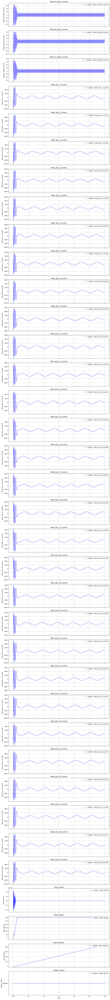

In [ ]:
df = [df_healthy]
colors = ['blue']
labels = ['Healthy']
plot_multiple_dataframes(df, colors, labels)

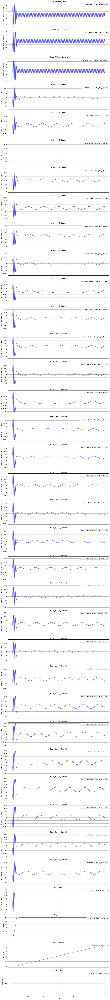

In [ ]:
df = [df_1broken]
colors = ['blue']
labels = ['1 Bar Broken']
plot_multiple_dataframes(df, colors, labels)

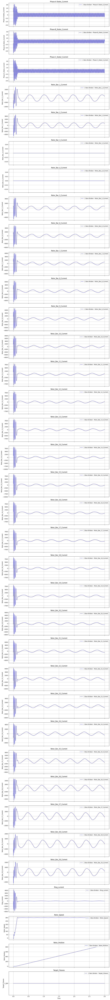

In [ ]:
df = [df_2broken]
colors = ['blue']
labels = ['2 Bars Broken']
plot_multiple_dataframes(df, colors, labels)

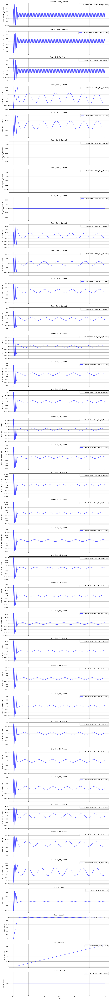

In [ ]:
df = [df_3broken]
colors = ['blue']
labels = ['3 Bars Broken']
plot_multiple_dataframes(df, colors, labels)

Various Conditions plotted together

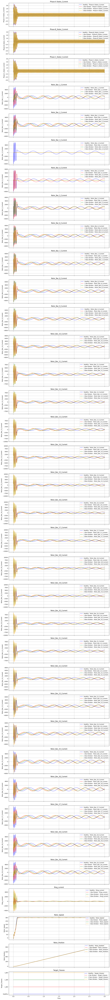

In [ ]:
df = [df_healthy, df_1broken, df_2broken, df_3broken]
colors = ['blue', 'red', 'green', 'orange']
labels = ['Healthy', '1 Bar Broken', '2 Bars Broken', '3 Bars Broken']
plot_multiple_dataframes(df, colors, labels)

# Observation:

The machine starts with transient as reflected in the dataset, it also contains the current of all rotor bars and rotor ring which is not always possible to measure so to maintain ideality and generality we aught to drop the ring and rotor currents

In [ ]:
df_healthy.drop(['Rotor_Bar_1_Current','Rotor_Bar_2_Current','Rotor_Bar_3_Current','Rotor_Bar_4_Current','Rotor_Bar_5_Current','Rotor_Bar_6_Current','Rotor_Bar_7_Current','Rotor_Bar_8_Current','Rotor_Bar_9_Current','Rotor_Bar_10_Current','Rotor_Bar_11_Current','Rotor_Bar_12_Current','Rotor_Bar_13_Current','Rotor_Bar_14_Current','Rotor_Bar_15_Current','Rotor_Bar_16_Current','Rotor_Bar_17_Current','Rotor_Bar_18_Current','Rotor_Bar_19_Current','Rotor_Bar_20_Current','Rotor_Bar_21_Current','Rotor_Bar_22_Current','Rotor_Bar_23_Current','Rotor_Bar_24_Current','Rotor_Bar_25_Current','Rotor_Bar_26_Current','Rotor_Bar_27_Current','Rotor_Bar_28_Current','Rotor_Bar_29_Current', 'Ring_current'],axis=1,inplace=True)
df_1broken.drop(['Rotor_Bar_1_Current','Rotor_Bar_2_Current','Rotor_Bar_3_Current','Rotor_Bar_4_Current','Rotor_Bar_5_Current','Rotor_Bar_6_Current','Rotor_Bar_7_Current','Rotor_Bar_8_Current','Rotor_Bar_9_Current','Rotor_Bar_10_Current','Rotor_Bar_11_Current','Rotor_Bar_12_Current','Rotor_Bar_13_Current','Rotor_Bar_14_Current','Rotor_Bar_15_Current','Rotor_Bar_16_Current','Rotor_Bar_17_Current','Rotor_Bar_18_Current','Rotor_Bar_19_Current','Rotor_Bar_20_Current','Rotor_Bar_21_Current','Rotor_Bar_22_Current','Rotor_Bar_23_Current','Rotor_Bar_24_Current','Rotor_Bar_25_Current','Rotor_Bar_26_Current','Rotor_Bar_27_Current','Rotor_Bar_28_Current','Rotor_Bar_29_Current', 'Ring_current'],axis=1,inplace=True)
df_2broken.drop(['Rotor_Bar_1_Current','Rotor_Bar_2_Current','Rotor_Bar_3_Current','Rotor_Bar_4_Current','Rotor_Bar_5_Current','Rotor_Bar_6_Current','Rotor_Bar_7_Current','Rotor_Bar_8_Current','Rotor_Bar_9_Current','Rotor_Bar_10_Current','Rotor_Bar_11_Current','Rotor_Bar_12_Current','Rotor_Bar_13_Current','Rotor_Bar_14_Current','Rotor_Bar_15_Current','Rotor_Bar_16_Current','Rotor_Bar_17_Current','Rotor_Bar_18_Current','Rotor_Bar_19_Current','Rotor_Bar_20_Current','Rotor_Bar_21_Current','Rotor_Bar_22_Current','Rotor_Bar_23_Current','Rotor_Bar_24_Current','Rotor_Bar_25_Current','Rotor_Bar_26_Current','Rotor_Bar_27_Current','Rotor_Bar_28_Current','Rotor_Bar_29_Current', 'Ring_current'],axis=1,inplace=True)
df_3broken.drop(['Rotor_Bar_1_Current','Rotor_Bar_2_Current','Rotor_Bar_3_Current','Rotor_Bar_4_Current','Rotor_Bar_5_Current','Rotor_Bar_6_Current','Rotor_Bar_7_Current','Rotor_Bar_8_Current','Rotor_Bar_9_Current','Rotor_Bar_10_Current','Rotor_Bar_11_Current','Rotor_Bar_12_Current','Rotor_Bar_13_Current','Rotor_Bar_14_Current','Rotor_Bar_15_Current','Rotor_Bar_16_Current','Rotor_Bar_17_Current','Rotor_Bar_18_Current','Rotor_Bar_19_Current','Rotor_Bar_20_Current','Rotor_Bar_21_Current','Rotor_Bar_22_Current','Rotor_Bar_23_Current','Rotor_Bar_24_Current','Rotor_Bar_25_Current','Rotor_Bar_26_Current','Rotor_Bar_27_Current','Rotor_Bar_28_Current','Rotor_Bar_29_Current', 'Ring_current'],axis=1,inplace=True)

In [ ]:
df_healthy.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position,Target_Classes
Time,,,,,,
0.0010,11.251738,-7.225974,-4.025764,-2.606268,-0.001303,Healthy
0.0015,15.667036,-11.275256,-4.391779,-3.904210,-0.002932,Healthy
0.0020,19.201193,-15.426750,-3.774443,-5.188613,-0.005206,Healthy
0.0025,21.818096,-19.540866,-2.277230,-6.443648,-0.008115,Healthy
0.0030,23.498826,-23.482554,-0.016272,-7.646217,-0.011642,Healthy
0.0035,24.241129,-27.123980,2.882851,-8.764413,-0.015750,Healthy
0.0040,24.062532,-30.348713,6.286181,-9.762784,-0.020385,Healthy
0.0045,23.000522,-33.052487,10.051965,-10.602714,-0.025484,Healthy
0.0050,21.109524,-35.145960,14.036436,-11.238871,-0.030954,Healthy


In [ ]:
df_1broken.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position,Target_Classes
Time,,,,,,
0.0010,10.598895,-6.912946,-3.685949,-2.600098,-0.001302,1_BB
0.0015,14.795954,-10.837429,-3.958525,-3.879932,-0.002923,1_BB
0.0020,18.181205,-14.884818,-3.296386,-5.125086,-0.005176,1_BB
0.0025,20.715348,-18.915877,-1.799471,-6.313134,-0.008039,1_BB
0.0030,22.375475,-22.796213,0.420738,-7.417498,-0.011475,1_BB
0.0035,23.156040,-26.399067,3.243027,-8.408917,-0.015437,1_BB
0.0040,23.069731,-29.607805,6.538074,-9.256494,-0.019861,1_BB
0.0045,22.146408,-32.317224,10.170816,-9.927968,-0.024665,1_BB
0.0050,20.434076,-34.437895,14.003819,-10.393359,-0.029754,1_BB


In [ ]:
df_2broken.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position,Target_Classes
Time,,,,,,
0.0010,9.796633,-6.470060,-3.326573,-2.598229,-0.001302,2_BB
0.0015,13.701869,-10.267853,-3.434016,-3.860858,-0.002919,2_BB
0.0020,16.870226,-14.240835,-2.629391,-5.055131,-0.005152,2_BB
0.0025,19.262636,-18.241967,-1.020669,-6.139251,-0.007956,2_BB
0.0030,20.855343,-22.129136,1.273793,-7.070898,-0.011266,2_BB
0.0035,21.640056,-25.768039,4.127983,-7.811863,-0.014995,2_BB
0.0040,21.625413,-29.034897,7.409484,-8.333353,-0.019041,2_BB
0.0045,20.836995,-31.818619,10.981624,-8.616696,-0.023290,2_BB
0.0050,19.315836,-34.022506,14.706670,-8.652854,-0.027618,2_BB


In [ ]:
df_3broken.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position,Target_Classes
Time,,,,,,
0.0010,8.528214,-5.525085,-3.003129,-2.611430,-0.001306,3_BB
0.0015,11.941219,-8.986605,-2.954614,-3.884355,-0.002932,3_BB
0.0020,14.721084,-12.713923,-2.007161,-5.066371,-0.005175,3_BB
0.0025,16.833501,-16.557912,-0.275589,-6.085221,-0.007972,3_BB
0.0030,18.257258,-20.372948,2.115690,-6.867947,-0.011221,3_BB
0.0035,18.984877,-24.018872,5.033995,-7.351475,-0.014789,3_BB
0.0040,19.022148,-27.364006,8.341858,-7.489402,-0.018513,3_BB
0.0045,18.388963,-30.288588,11.899625,-7.262912,-0.022218,3_BB
0.0050,17.119311,-32.686113,15.566802,-6.681174,-0.025719,3_BB


In [ ]:
df_healthy.shape

(5999, 6)

In [ ]:
df_1broken.shape

(5999, 6)

In [ ]:
df_2broken.shape

(5999, 6)

In [ ]:
df_3broken.shape

(5999, 6)

In [ ]:
df_healthy.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5999 entries, 0.001 to 3.0
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Phase-A Stator_Current  5999 non-null   float64
 1   Phase-B_Stator_Current  5999 non-null   float64
 2   Phase-C_Stator_Current  5999 non-null   float64
 3   Rotor_Speed             5999 non-null   float64
 4   Rotor_Position          5999 non-null   float64
 5   Target_Classes          5999 non-null   object 
dtypes: float64(5), object(1)
memory usage: 328.1+ KB


In [ ]:
df_1broken.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5999 entries, 0.001 to 3.0
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Phase-A Stator_Current  5999 non-null   float64
 1   Phase-B_Stator_Current  5999 non-null   float64
 2   Phase-C_Stator_Current  5999 non-null   float64
 3   Rotor_Speed             5999 non-null   float64
 4   Rotor_Position          5999 non-null   float64
 5   Target_Classes          5999 non-null   object 
dtypes: float64(5), object(1)
memory usage: 328.1+ KB


In [ ]:
df_2broken.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5999 entries, 0.001 to 3.0
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Phase-A Stator_Current  5999 non-null   float64
 1   Phase-B_Stator_Current  5999 non-null   float64
 2   Phase-C_Stator_Current  5999 non-null   float64
 3   Rotor_Speed             5999 non-null   float64
 4   Rotor_Position          5999 non-null   float64
 5   Target_Classes          5999 non-null   object 
dtypes: float64(5), object(1)
memory usage: 328.1+ KB


In [ ]:
df_3broken.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5999 entries, 0.001 to 3.0
Data columns (total 6 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   Phase-A Stator_Current  5999 non-null   float64
 1   Phase-B_Stator_Current  5999 non-null   float64
 2   Phase-C_Stator_Current  5999 non-null   float64
 3   Rotor_Speed             5999 non-null   float64
 4   Rotor_Position          5999 non-null   float64
 5   Target_Classes          5999 non-null   object 
dtypes: float64(5), object(1)
memory usage: 328.1+ KB


In [ ]:
df_healthy.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000
mean,-0.003890,-0.080638,0.084528,294.581635,431.269109
std,5.850593,5.923690,5.880706,39.213039,260.823210
min,-33.870174,-37.232269,-32.142767,-11.719949,-0.072167
25%,-4.437789,-4.229560,-4.305273,301.815462,204.663008
50%,0.220253,-0.096213,0.196351,301.815468,430.949156
75%,4.437789,4.229555,4.305275,301.815476,657.235305
max,34.724296,30.956203,38.020554,305.586981,883.521453


In [ ]:
df_1broken.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000
mean,-0.003978,-0.080581,0.084559,293.597357,428.922732
std,5.861706,5.945735,5.906317,40.779881,260.403894
min,-32.363798,-36.639724,-31.024186,-10.625073,-0.066635
25%,-4.435731,-4.260303,-4.282368,301.098446,202.554434
50%,0.137081,-0.020451,0.063725,301.429442,428.560038
75%,4.437694,4.228825,4.290938,301.733632,654.564988
max,32.952940,30.237911,36.826211,303.431976,880.569191


In [ ]:
df_2broken.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000
mean,-0.004273,-0.080483,0.084757,293.482448,429.275666
std,5.699158,5.812586,5.776457,39.453407,260.021975
min,-31.135134,-36.469648,-30.055312,-8.652854,-0.051143
25%,-4.428623,-4.303601,-4.306689,300.171539,203.268476
50%,-0.111135,-0.009481,0.009651,300.978754,428.928886
75%,4.427998,4.229694,4.325964,301.613149,654.588312
max,32.215790,29.907388,35.403070,305.423114,880.224735


In [ ]:
df_3broken.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,5999.000000,5999.000000,5999.000000,5999.000000,5999.000000
mean,-0.003971,-0.080636,0.084607,292.613663,427.760377
std,5.619490,5.746974,5.750532,39.478716,259.369259
min,-30.034509,-35.923432,-30.127731,-7.489402,-0.035126
25%,-4.408355,-4.389159,-4.372621,298.842567,202.337469
50%,0.003033,-0.004434,0.024734,300.307462,427.413350
75%,4.408130,4.317657,4.392904,301.380078,652.430661
max,32.381507,29.184141,34.545914,301.735970,877.618606


# Data Processing:

Directly using the stator terminal current , rotor speed, rotor position for training

In [ ]:
#Concatenate all dataframes
df_combined = pd.concat([df_healthy, df_1broken, df_2broken, df_3broken], ignore_index=True)

In [ ]:
df_combined.isnull().sum()

In [ ]:
df_combined.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position,Target_Classes
0,11.251738,-7.225974,-4.025764,-2.606268,-0.001303,Healthy
1,15.667036,-11.275256,-4.391779,-3.904210,-0.002932,Healthy
2,19.201193,-15.426750,-3.774443,-5.188613,-0.005206,Healthy
3,21.818096,-19.540866,-2.277230,-6.443648,-0.008115,Healthy
4,23.498826,-23.482554,-0.016272,-7.646217,-0.011642,Healthy
5,24.241129,-27.123980,2.882851,-8.764413,-0.015750,Healthy
6,24.062532,-30.348713,6.286181,-9.762784,-0.020385,Healthy
7,23.000522,-33.052487,10.051965,-10.602714,-0.025484,Healthy
8,21.109524,-35.145960,14.036436,-11.238871,-0.030954,Healthy
9,18.461682,-36.557049,18.095367,-11.625788,-0.036681,Healthy


In [ ]:
df_combined.shape

(23996, 6)

In [ ]:
df_combined.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,23996.000000,23996.000000,23996.000000,23996.000000,23996.000000
mean,-0.004028,-0.080584,0.084613,293.568776,429.306971
std,5.758288,5.857443,5.828515,39.739647,260.141941
min,-33.870174,-37.232269,-32.142767,-11.719949,-0.072167
25%,-4.436487,-4.229575,-4.305274,300.505146,203.186343
50%,0.003298,-0.015687,0.024926,301.432532,428.958121
75%,4.435922,4.229559,4.305302,301.815462,654.749606
max,34.724296,30.956203,38.020554,305.586981,883.521453


We need to standarize the dataset since the rotor speed and rotor position and currents have a large mean difference which might effect the model training

In [ ]:
#Separating Target Class from rest
x = df_combined.drop('Target_Classes',axis=1)
y = df_combined['Target_Classes']

In [ ]:
scaler=StandardScaler()
x_array=scaler.fit_transform(x)
x=pd.DataFrame(x_array,columns=x.columns)
x.head(10)

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
0,1.954748,-1.219907,-0.705233,-7.453041,-1.650319
1,2.721536,-1.911227,-0.768032,-7.485703,-1.650325
2,3.335301,-2.619997,-0.662113,-7.518024,-1.650334
3,3.789769,-3.322386,-0.405230,-7.549606,-1.650345
4,4.081655,-3.995336,-0.017309,-7.579868,-1.650359
5,4.210568,-4.617024,0.480105,-7.608006,-1.650375
6,4.179552,-5.167572,1.064027,-7.633130,-1.650392
7,3.995116,-5.629178,1.710137,-7.654266,-1.650412
8,3.666714,-5.986589,2.393768,-7.670274,-1.650433
9,3.206872,-6.227499,3.090174,-7.680011,-1.650455


In [ ]:
x.describe()

,Phase-A Stator_Current,Phase-B_Stator_Current,Phase-C_Stator_Current,Rotor_Speed,Rotor_Position
count,2.399600e+04,2.399600e+04,2.399600e+04,2.399600e+04,2.399600e+04
mean,-2.454002e-17,-2.265233e-17,-2.309649e-17,1.350256e-16,6.632838e-17
std,1.000021e+00,1.000021e+00,1.000021e+00,1.000021e+00,1.000021e+00
min,-5.881410e+00,-6.342777e+00,-5.529376e+00,-7.682380e+00,-1.650592e+00
25%,-7.697689e-01,-7.083427e-01,-7.531898e-01,1.745490e-01,-8.692383e-01
50%,1.272345e-03,1.107964e-02,-1.024072e-02,1.978860e-01,-1.341028e-03
75%,7.710700e-01,7.358558e-01,7.241599e-01,2.075222e-01,8.666320e-01
max,6.031141e+00,5.298802e+00,6.508816e+00,3.024298e-01,1.746062e+00


In [ ]:
#Encoding the target class as machine learning models cannot accept any other datatype except numerical values
le=LabelEncoder()
y=le.fit_transform(y)

In [ ]:
#Splitting the Data into training and testing
x_train,x_test,y_train,y_test=train_test_split(x,y,test_size=0.2,random_state=42)

# Training Model

Selecting a preliminary model by evaluating various classifiers for optimal accuracy, followed by fine-tuning its hyperparameters to achieve further enhancement in performance.

In [ ]:
#Initial training on various classifiers to select a temporary best working model
classifiers = {
    'Logistic Regression': LogisticRegression(),
    'Random Forest': RandomForestClassifier(),
    'Support Vector Machine': SVC(),
    'K-Nearest Neighbors': KNeighborsClassifier(),
    'Decision Tree': DecisionTreeClassifier(),
    'AdaBoost': AdaBoostClassifier(),
    'Gradient Boosting': GradientBoostingClassifier()
}


for name, clf in classifiers.items():
    print(f"Training {name}...")
    clf.fit(x_train, y_train)
    print("Training set")
    y_pred = clf.predict(x_train)
    accuracy = accuracy_score(y_train, y_pred)
    print(f"{name} Accuracy: {accuracy}")
    print(classification_report(y_train, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_train, y_pred))
    print("----------------------------------------------------------------------------------")
    print("Testing set")
    y_pred = clf.predict(x_test)
    accuracy = accuracy_score(y_test, y_pred)
    print(f"{name} Accuracy: {accuracy}")
    print(classification_report(y_test, y_pred))
    print("Confusion Matrix:")
    print(confusion_matrix(y_test, y_pred))
    print("===================================================================================")
    print("\n")

Training Logistic Regression...
Training set
Logistic Regression Accuracy: 0.2712023338195457
              precision    recall  f1-score   support

           0       0.24      0.29      0.26      4803
           1       0.26      0.18      0.21      4803
           2       0.32      0.16      0.21      4785
           3       0.28      0.46      0.35      4805

    accuracy                           0.27     19196
   macro avg       0.28      0.27      0.26     19196
weighted avg       0.27      0.27      0.26     19196

Confusion Matrix:
[[1381  804  548 2070]
 [1432  842  630 1899]
 [1499  866  765 1655]
 [1335  784  468 2218]]
----------------------------------------------------------------------------------
Testing set
Logistic Regression Accuracy: 0.26979166666666665
              precision    recall  f1-score   support

           0       0.23      0.28      0.25      1196
           1       0.25      0.18      0.21      1196
           2       0.33      0.15      0.21      121

/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_weight_boosting.py:527: FutureWarning: The SAMME.R algorithm (the default) is deprecated and will be removed in 1.6. Use the SAMME algorithm to circumvent this warning.
  warnings.warn(


Training set
AdaBoost Accuracy: 0.29928110022921445
              precision    recall  f1-score   support

           0       0.45      0.21      0.29      4803
           1       0.25      0.76      0.38      4803
           2       0.42      0.17      0.24      4785
           3       0.50      0.05      0.10      4805

    accuracy                           0.30     19196
   macro avg       0.41      0.30      0.25     19196
weighted avg       0.41      0.30      0.25     19196

Confusion Matrix:
[[1023 3077  571  132]
 [ 611 3649  457   86]
 [ 575 3360  820   30]
 [  68 4370  114  253]]
----------------------------------------------------------------------------------
Testing set
AdaBoost Accuracy: 0.29041666666666666
              precision    recall  f1-score   support

           0       0.42      0.21      0.28      1196
           1       0.25      0.74      0.37      1196
           2       0.42      0.16      0.24      1214
           3       0.45      0.05      0.09      11

It seems that the Random Forest , Decision Trees and Gradient Boosting works the best but Random Forest being an ensemble technique consisting of Decision Trees we can use the Gradient Boosting and Random Forest for further development and omit the Decision Tree.

Random Forest seems to fit a the training set a bit more ideally than the testing set showing overfitting which needs to be dealt with. So using hyper parameter tuning by grid search CV.

In [ ]:
# # Define the Random Forest model
# rf = RandomForestClassifier(random_state=42)

# # Define a simple parameter grid
# param_grid = {
#     'n_estimators': [1000],               # Number of trees in the forest
#     'max_depth': [None, 10, 20, 30],               # Depth of the trees
#     'min_samples_split': [2, 5, 10],               # Minimum samples required to split an internal node
#     'min_samples_leaf': [1, 2, 4],                 # Minimum samples required to be at a leaf node
#     'max_features': ['auto', 'sqrt', 'log2'],     # Number of features to consider for splitting
# }

# # Set up GridSearchCV with cross-validation
# grid_search = GridSearchCV(estimator=rf, param_grid=param_grid, cv=3, n_jobs=-1, verbose=2)

# # Fit the model on your training data
# grid_search.fit(x_train, y_train)

# # Get the best parameters
# print("Best Parameters:", grid_search.best_params_)

In [ ]:
rf = RandomForestClassifier(n_estimators=100,min_samples_leaf=1,min_samples_split=2)
rf.fit(x_train, y_train)
y_pred = rf.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Random Forest Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))

Random Forest Accuracy: 0.9095833333333333
              precision    recall  f1-score   support

           0       0.85      0.92      0.88      1196
           1       0.88      0.85      0.87      1196
           2       0.94      0.89      0.92      1214
           3       0.97      0.98      0.97      1194

    accuracy                           0.91      4800
   macro avg       0.91      0.91      0.91      4800
weighted avg       0.91      0.91      0.91      4800



# Stacking 2 Algorithms:

Using both the gradient boost classifier and random forest by stacking them as base learners and using a random forest meta learner.

In [ ]:
# Define base models
base_learners = [
    ('rf', RandomForestClassifier(n_estimators=1000,max_features=None,criterion="gini", random_state=42)),
    ('gb', GradientBoostingClassifier())
]

# Define the meta-model
meta_model = RandomForestClassifier()

# Define the Stacking Classifier
stacking_model = StackingClassifier(estimators=base_learners, final_estimator=meta_model)

# Train the model
stacking_model.fit(x_train, y_train)

# Prediction
y_pred = stacking_model.predict(x_test)
accuracy = accuracy_score(y_test, y_pred)
print(f"Stacking Model Accuracy: {accuracy}")
print(classification_report(y_test, y_pred))

Stacking Model Accuracy: 0.944375
              precision    recall  f1-score   support

           0       0.93      0.94      0.93      1196
           1       0.92      0.91      0.92      1196
           2       0.96      0.95      0.96      1214
           3       0.97      0.98      0.97      1194

    accuracy                           0.94      4800
   macro avg       0.94      0.94      0.94      4800
weighted avg       0.94      0.94      0.94      4800



In [ ]:
#Checking for overfitting
y_pred = stacking_model.predict(x_train)
accuracy = accuracy_score(y_train, y_pred)
print(f"Stacking Model Accuracy: {accuracy}")
print(classification_report(y_train, y_pred))

Stacking Model Accuracy: 0.9977599499895812
              precision    recall  f1-score   support

           0       1.00      1.00      1.00      4803
           1       1.00      1.00      1.00      4803
           2       1.00      1.00      1.00      4785
           3       1.00      1.00      1.00      4805

    accuracy                           1.00     19196
   macro avg       1.00      1.00      1.00     19196
weighted avg       1.00      1.00      1.00     19196



# Inference:

The stacking algorithm works quite well with an overall accuracy of 94.45% and shows very less overfitting.

This model can be used for induction motors working under similar conditions and having similar machine parameters.

# Validation

Motor Current Signature Analysis (MCSA) of the stator's three-phase winding, utilizing Fast Fourier Transform (FFT), can further confirm the presence of a fault caused by rotor bar breakage. This is evidenced by frequency anomalies occurring at f(1 - 2s) and f(1 + 2s).

To observe the fft we are neglecting the initial transient part and considering rest.

In [ ]:
def plot_fft(df, column_name):
    # Perform FFT on the column
    fft_values = np.fft.fft(df[column_name])
    fft_magnitudes = np.abs(fft_values)

    # Frequency axis
    sample_rate = 500  # Sampling frequency in Hz (this should match your data)
    frequencies = np.fft.fftfreq(len(fft_values), d=1/sample_rate)

    # Only take the positive half of the spectrum for plotting
    positive_frequencies = frequencies[:500]
    positive_magnitudes = fft_magnitudes[:500]

    # Plotting the FFT result
    plt.figure(figsize=(10, 5))
    plt.plot(positive_frequencies, positive_magnitudes)
    plt.title(f'Frequency Spectrum of {column_name}')
    plt.xlabel("Frequency (Hz)")
    plt.ylabel("Magnitude")
    plt.grid()
    plt.show()

In [ ]:
# Taking dataset without transient
df_healthy_sub = df_healthy.iloc[500:]
df_1broken_sub = df_1broken.iloc[500:]
df_2broken_sub = df_2broken.iloc[500:]
df_3broken_sub = df_3broken.iloc[500:]

**Fast Fourier Transform**:

Healthy Condition-

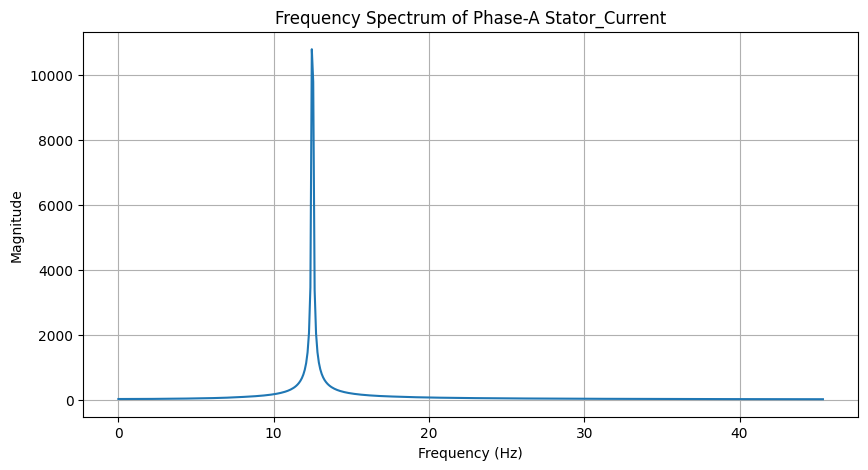

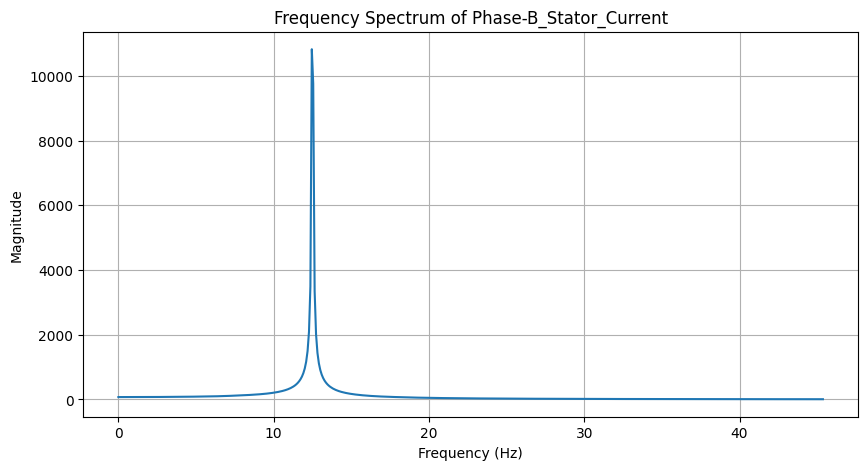

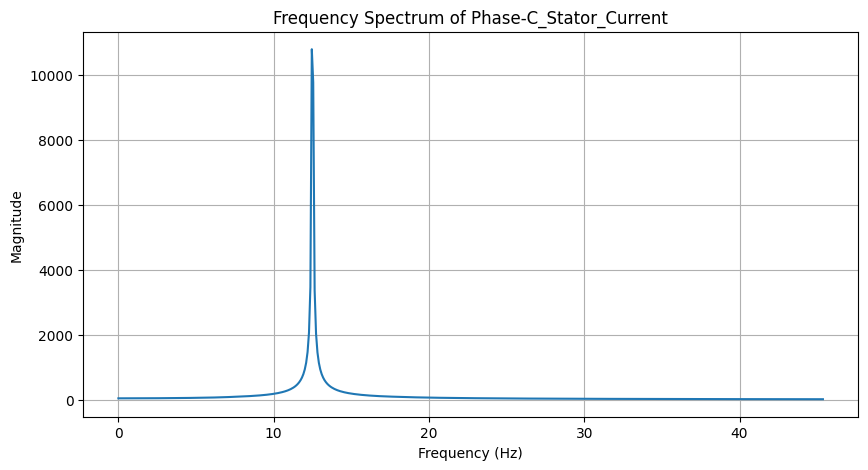

In [ ]:
plot_fft(df_healthy_sub, 'Phase-A Stator_Current')
plot_fft(df_healthy_sub, 'Phase-B_Stator_Current')
plot_fft(df_healthy_sub, 'Phase-C_Stator_Current')

1 Rotor Broken Bar-

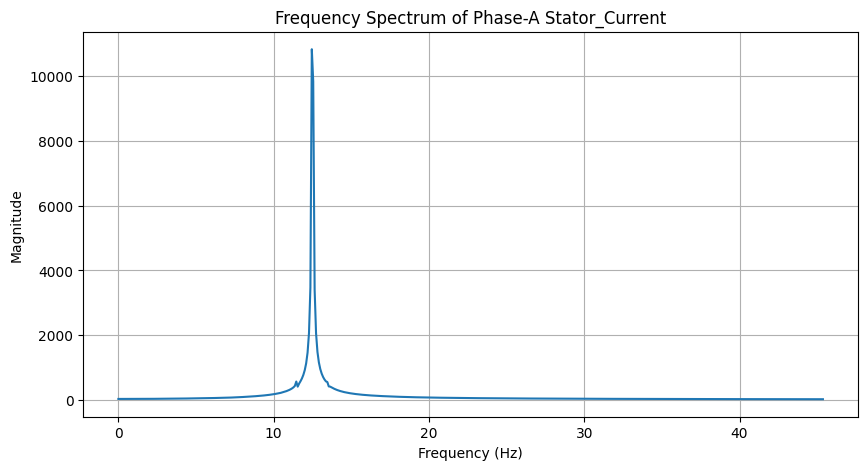

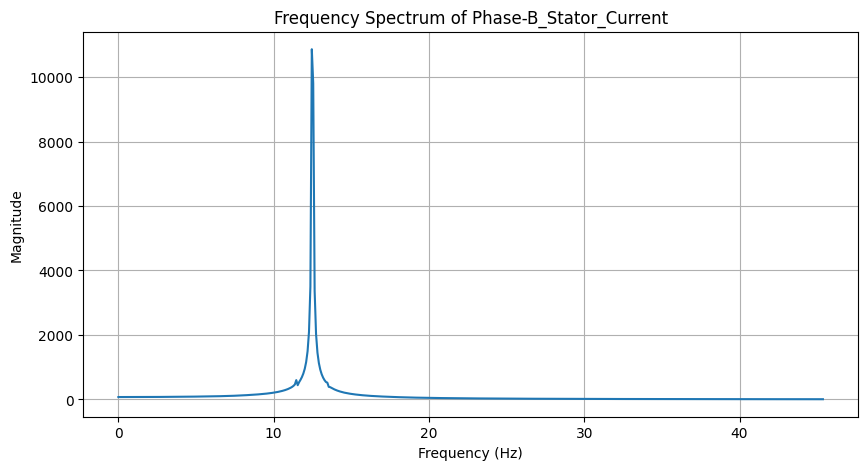

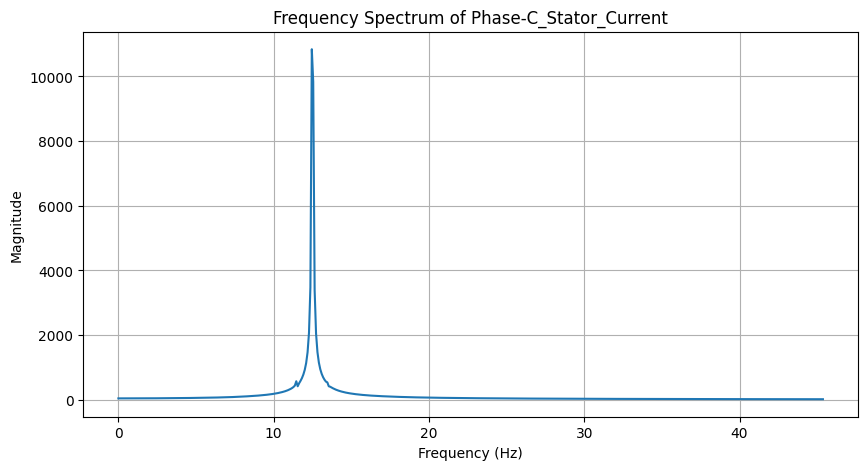

In [ ]:
plot_fft(df_1broken_sub, 'Phase-A Stator_Current')
plot_fft(df_1broken_sub, 'Phase-B_Stator_Current')
plot_fft(df_1broken_sub, 'Phase-C_Stator_Current')

2 Rotor Bar Broken-

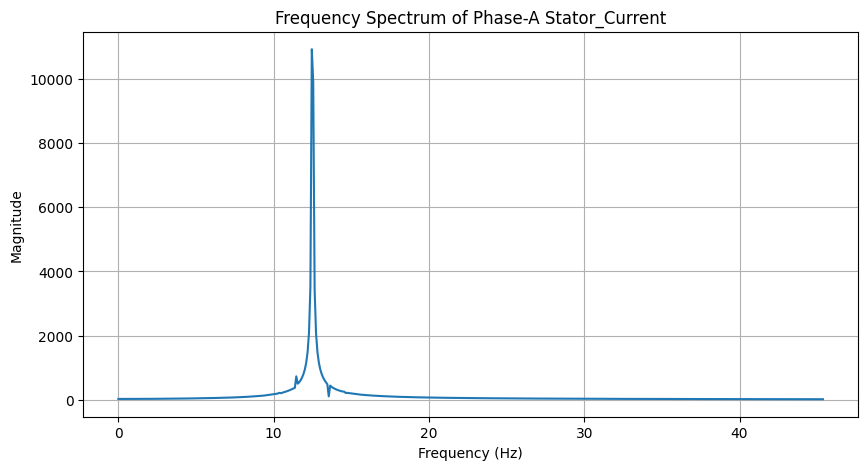

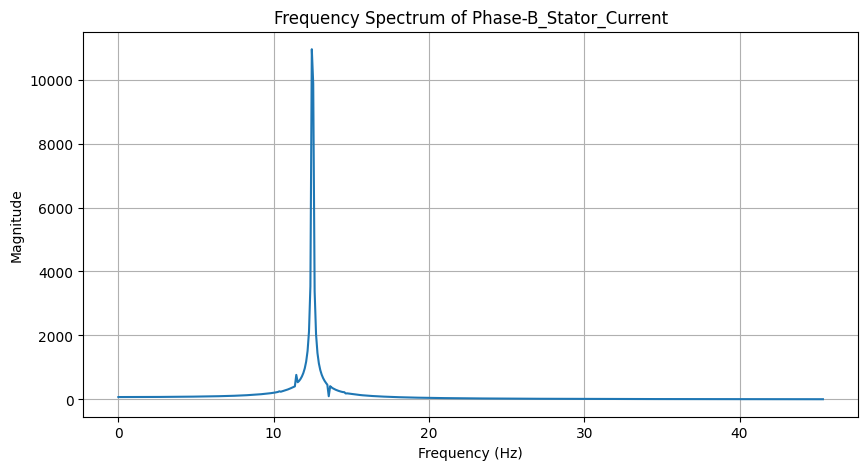

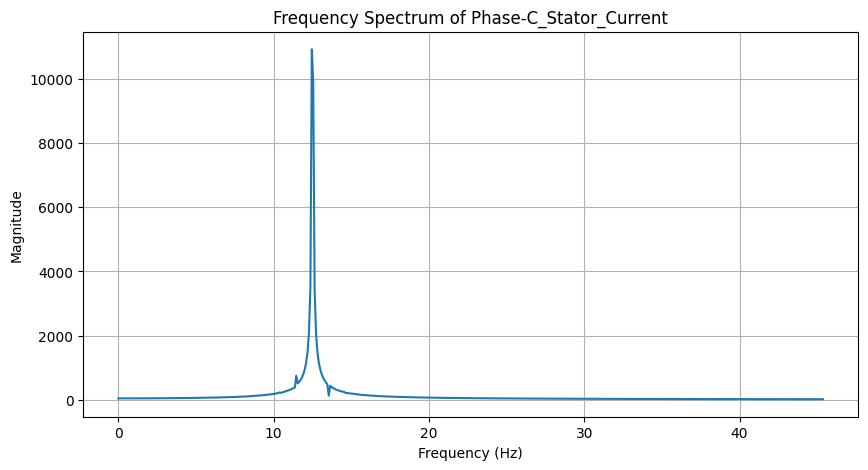

In [ ]:
plot_fft(df_2broken_sub, 'Phase-A Stator_Current')
plot_fft(df_2broken_sub, 'Phase-B_Stator_Current')
plot_fft(df_2broken_sub, 'Phase-C_Stator_Current')

3 Rotor Broken Bar-

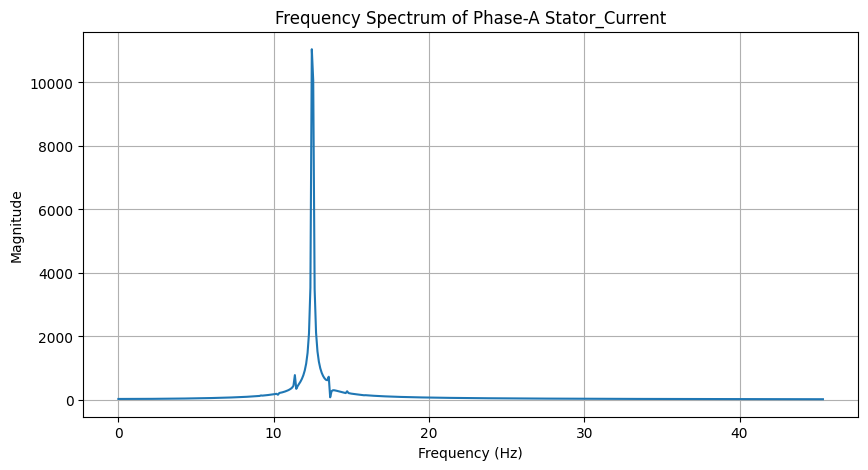

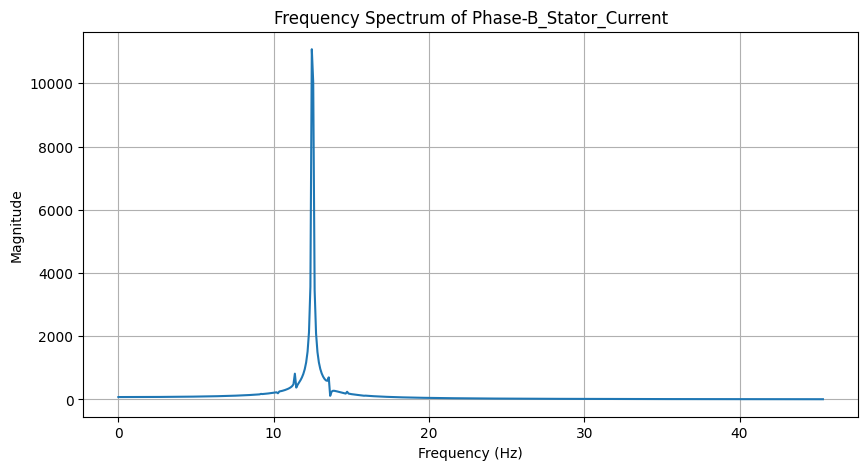

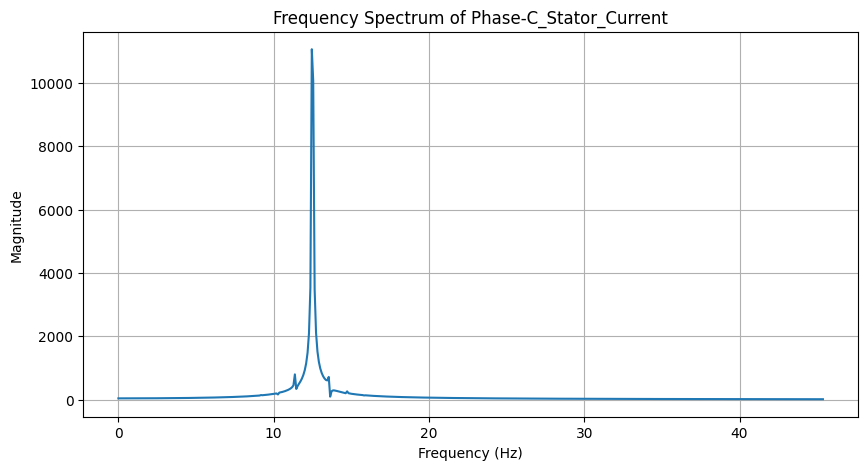

In [ ]:
plot_fft(df_3broken_sub, 'Phase-A Stator_Current')
plot_fft(df_3broken_sub, 'Phase-B_Stator_Current')
plot_fft(df_3broken_sub, 'Phase-C_Stator_Current')

On cross validating with FFT the sideband frequencies show that there is presence of broken bars. More broken bars is represented by more intense sideband frequency.

# Referrence

Abu Elhaija, Wejdan; Abu Al-Haija, Qasem (2022), “Broken Bars Induction Motors 2023 (BBIM2023)”, Mendeley Data, V1, doi: 10.17632/f5ksvkrp73.1

https://www.sciencedirect.com/science/article/pii/S2667305322001041?via%3Dihub
